# Install necessary packages


In [ ]:
!python -m pip install pyyaml==5.1
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'


# Import necessary libraries

In [2]:
from detectron2 import model_zoo
import pickle
import os
import random
import glob
import numpy as np
import cv2
import json
import itertools
import matplotlib.pyplot as plt
import torch, torchvision
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_train_loader, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from google.colab.patches import cv2_imshow

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Function to get dataset dictionaries

In [5]:
def get_phone_dicts(img_dir):
    dataset_dicts = []  # Create a list to store annotations for each image
    img_files = glob.glob(os.path.join(img_dir, '*.jpg'))  # Get a list of all image files in the directory

    for img_file in img_files:  # Iterate over each image file
        img_path = os.path.join(img_dir, img_file)  # Load the image file
        img = cv2.imread(img_path)  # Load the image using OpenCV
        height, width = img.shape[:2]  # Get the image size
        json_path = os.path.splitext(img_path)[0] + '.json'  # Load the corresponding LabelMe JSON file

        with open(json_path) as f:
            data = json.load(f)

        record = {}  # Create a dictionary to store annotations for the image
        record['file_name'] = img_path
        record['image_id'] = img_file
        record['height'] = height
        record['width'] = width
        objs = []  # Create a list to store annotations for each phone instance in the image

        for obj in data['shapes']:  # Iterate over each polygon in the LabelMe JSON file
            if obj['label'] == 'phone':
                poly = np.array(obj['points'])  # Extract the polygon vertices and convert to a numpy array
                obj_dict = {}  # Create a dictionary to store the annotation for the phone instance

                if len(poly) % 2 != 0:  # Skip polygons with odd number of coordinates
                    continue
                elif len(poly) < 6:  # If the polygon has fewer than 6 sides, convert it to a rectangle with the minimum bounding box
                    x, y, w, h = cv2.boundingRect(poly.astype(np.int32))
                    obj_dict['bbox'] = np.array([x, y, x + w, y + h])
                else:
                    obj_dict['bbox'] = np.array([np.min(poly[:, 0]), np.min(poly[:, 1]), np.max(poly[:, 0]), np.max(poly[:, 1])])

                obj_dict['bbox_mode'] = detectron2.structures.BoxMode.XYXY_ABS
                obj_dict['segmentation'] = [poly.flatten().tolist()]
                obj_dict['category_id'] = 0
                objs.append(obj_dict)

        record['annotations'] = objs
        dataset_dicts.append(record)

    return dataset_dicts

# Register the train and test datasets


In [7]:
img_dir = r"/content/drive/MyDrive/phones seg"
DatasetCatalog.clear()
for d in ["train", "test"]:

    DatasetCatalog.register("phone_" + d, lambda d=d: get_phone_dicts(os.path.join(img_dir, d)))
    MetadataCatalog.get("phone_" + d).set(thing_classes=["phone"])
phone_metadata = MetadataCatalog.get("phone_train")

# Define the model configuration


In [12]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("phone_train",)
cfg.DATASETS.TEST = ("phone_test",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.001
cfg.SOLVER.MAX_ITER = 300
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
cfg.INPUT.MASK_FORMAT = "bitmask"

os.makedirs(cfg.OUTPUT_DIR,exist_ok = True)


# Train the model


In [13]:
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[03/30 05:40:25 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[03/30 05:40:33 d2.engine.train_loop]: Starting training from iteration 0
[03/30 05:41:02 d2.utils.events]:  eta: 0:06:07  iter: 19  total_loss: 1.805  loss_cls: 0.6592  loss_box_reg: 0.5034  loss_mask: 0.6677  loss_rpn_cls: 0.007513  loss_rpn_loc: 0.005513    time: 1.3187  last_time: 1.3174  data_time: 0.8927  last_data_time: 0.7626   lr: 6.427e-05  max_mem: 2809M
[03/30 05:41:30 d2.utils.events]:  eta: 0:05:26  iter: 39  total_loss: 1.308  loss_cls: 0.3252  loss_box_reg: 0.482  loss_mask: 0.4812  loss_rpn_cls: 0.01046  loss_rpn_loc: 0.003233    time: 1.3678  last_time: 0.6118  data_time: 0.8695  last_data_time: 0.0158   lr: 0.00013087  max_mem: 2863M
[03/30 05:42:00 d2.utils.events]:  eta: 0:05:01  iter: 59  total_loss: 0.9556  loss_cls: 0.2268  loss_box_reg: 0.4621  loss_mask: 0.2647  loss_rpn_cls: 0.002425  loss_rpn_loc: 0.003998    time: 1.4086  last_time: 1.5303  data_time: 0.9080  last_data_time: 0.9898   lr: 0.00019747  max_mem: 2863M
[03/30 05:42:27 d2.utils.events]:  eta: 0:0

# Inference


In [14]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # Path to the trained model
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # Set a custom testing threshold
predictor = DefaultPredictor(cfg)

[03/30 06:01:23 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


# Visualization


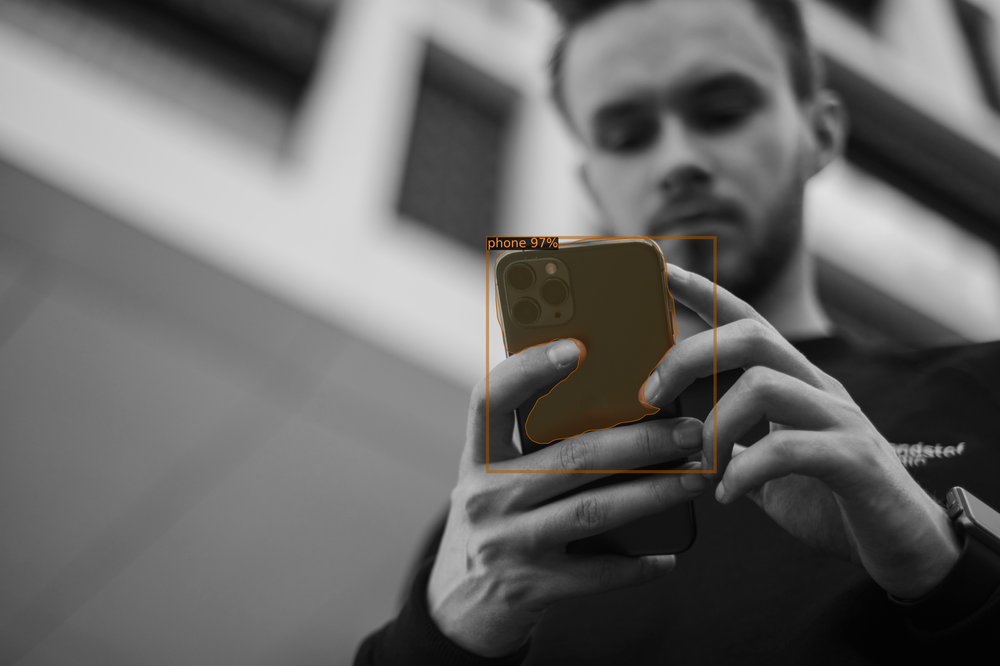

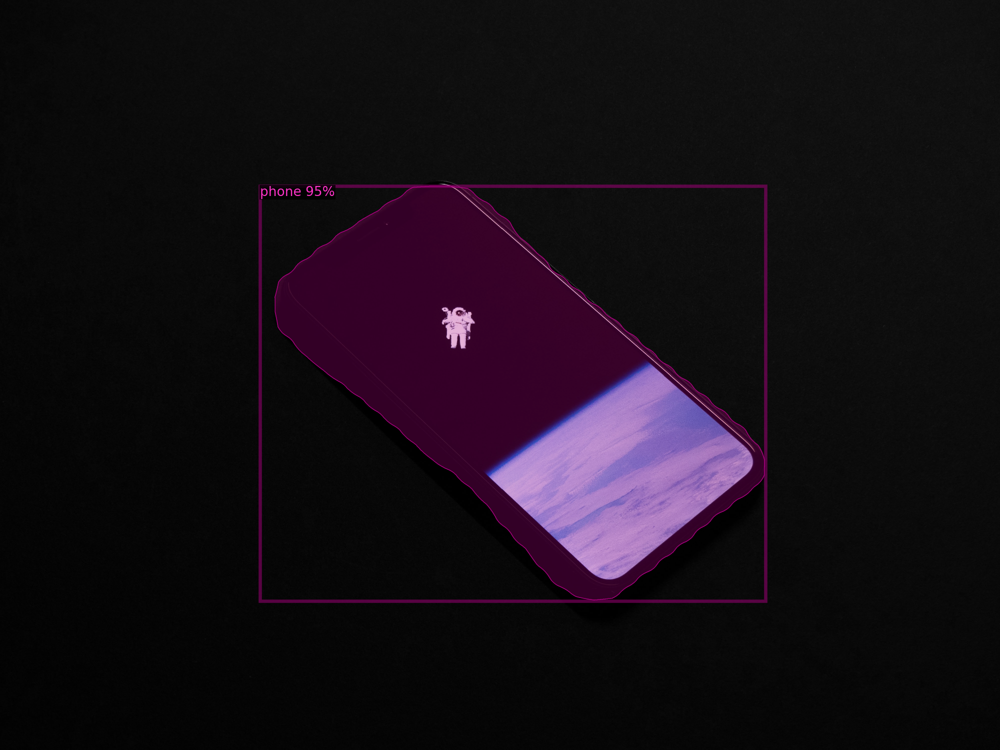

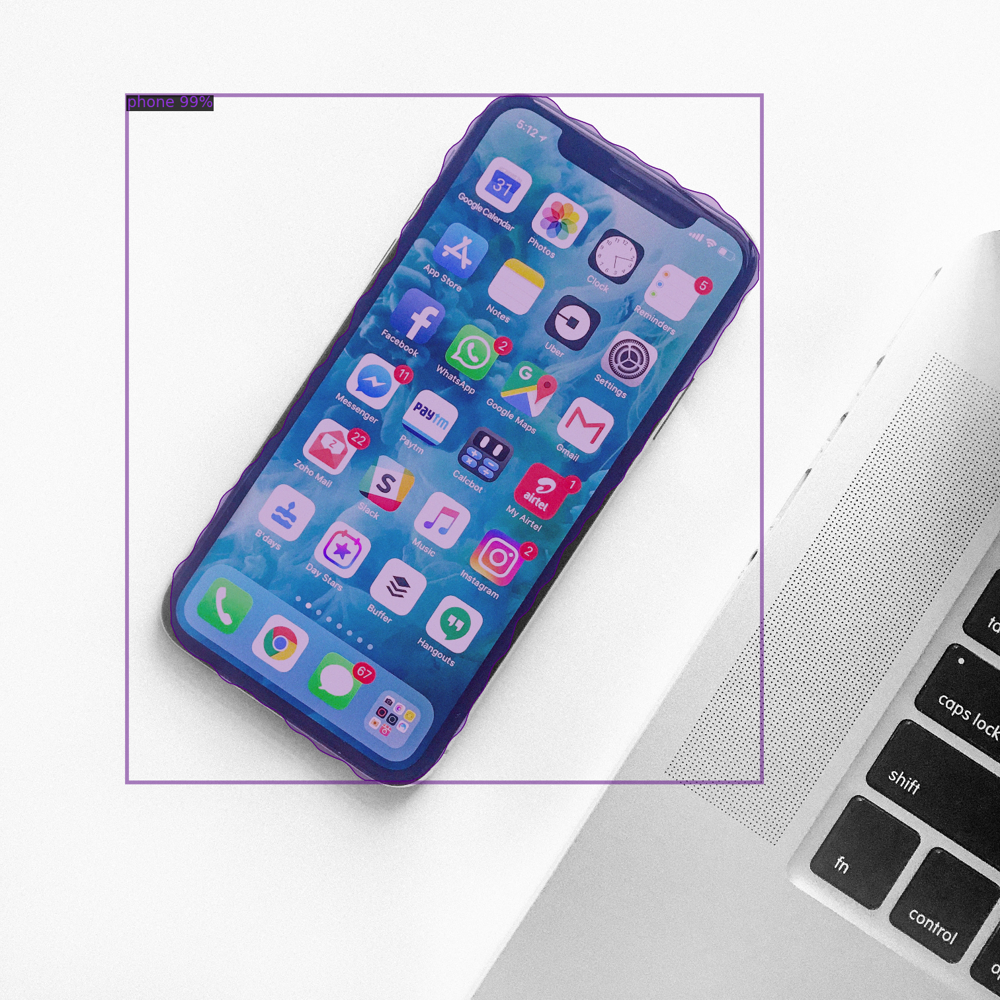

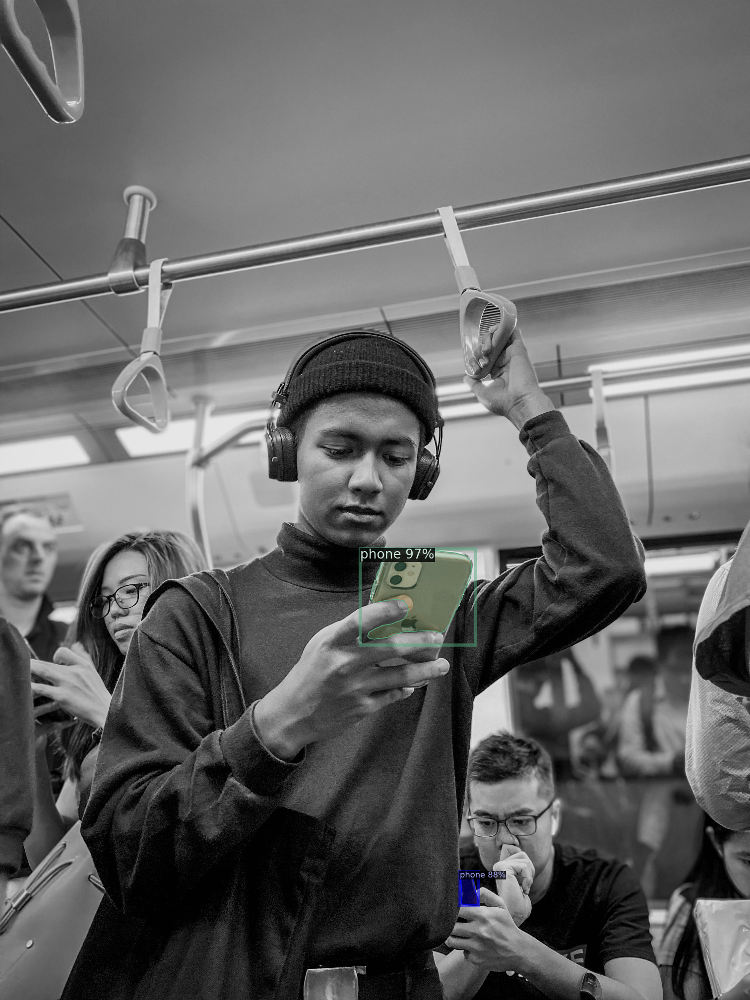

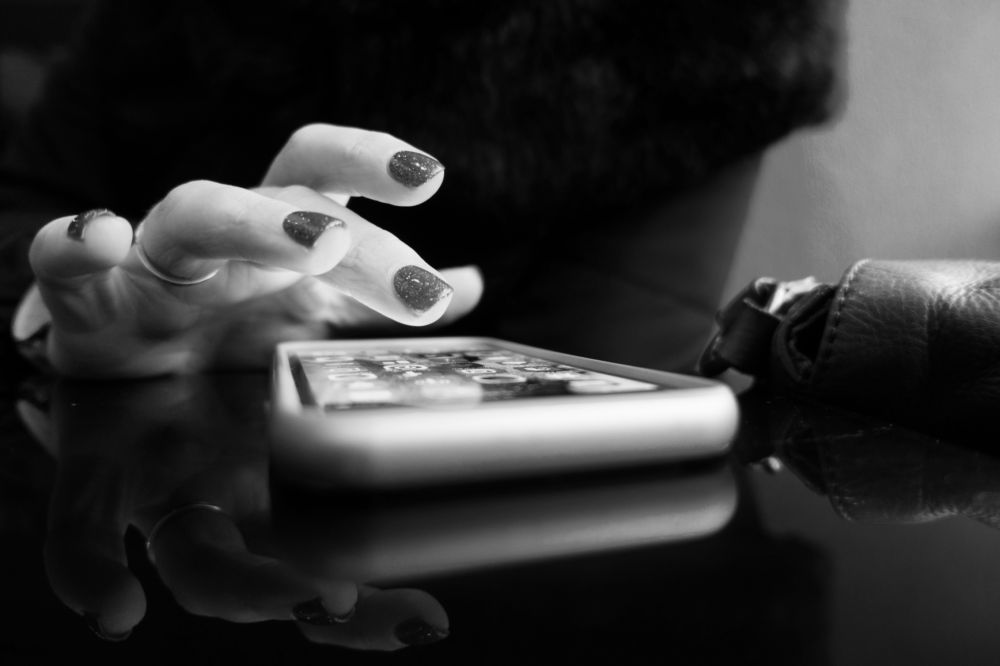

In [15]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_phone_dicts("/content/drive/MyDrive/phones/test")
for d in random.sample(dataset_dicts, 5):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=phone_metadata,
                   scale=0.5,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

# Save the config using pickle


In [16]:
output_path = '/content/drive/MyDrive/phones seg/outputs_seg/phones_seg.pickle'
with open(output_path, 'wb') as f:
    pickle.dump(cfg, f)

# Prediction on random image

In [17]:
# Load configuration of the model
with open('/content/drive/MyDrive/phones seg/outputs_seg/phones_seg.pickle',
          'rb') as f:
          cfg = pickle.load(f)

# Set the model weights path
cfg.MODEL.WEIGHTS = os.path.join('/content/drive/MyDrive/phones seg/outputs_seg/', 'model_final.pth')

# Create predictor
predictor = DefaultPredictor(cfg)

[03/30 06:02:25 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/phones seg/outputs_seg/model_final.pth ...


In [18]:
# Define a function to perform inference on an image
def onImage(image_path, predictor):
    # Read the image
    im = cv2.imread(image_path)
    # Perform inference
    outputs = predictor(im)
    # Visualize the predictions
    v = Visualizer(im[:, :, ::-1], metadata={}, scale=0.5, instance_mode=ColorMode.SEGMENTATION)
    v = v.draw_instance_predictions(outputs['instances'].to('cpu'))

    # Display the visualization
    plt.figure(figsize=(14, 10))
    plt.imshow(v.get_image())
    plt.show()


In [20]:
# Path to the image
image_path = '/content/drive/MyDrive/phones seg/test/t2.jpg'

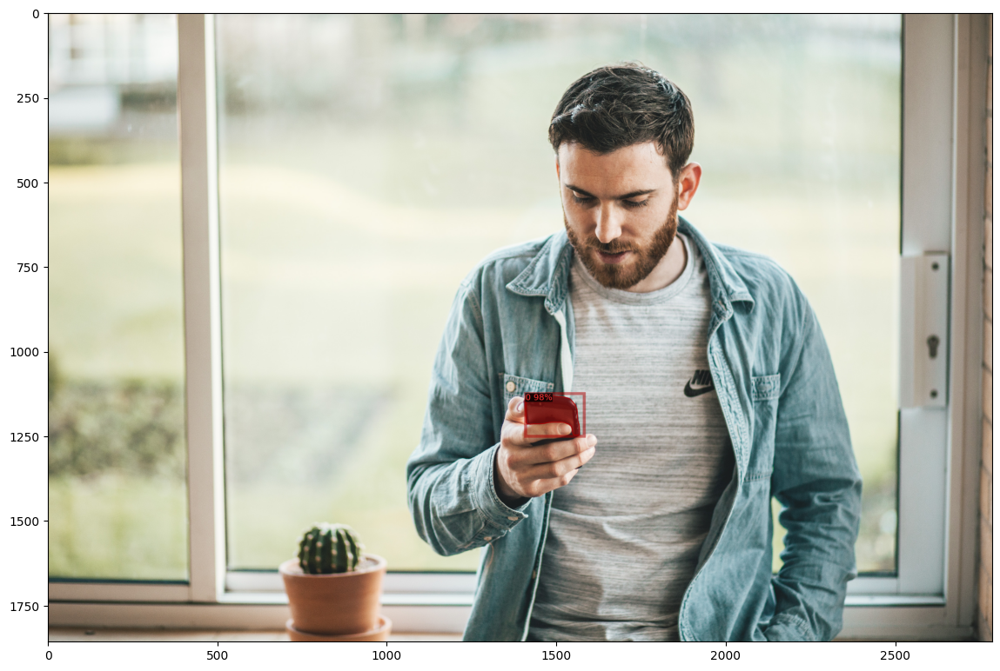

In [21]:
# Perform inference on the image
onImage(image_path, predictor)